<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Investigate-pricing-influence-on-AirBnB" data-toc-modified-id="Investigate-pricing-influence-on-AirBnB-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Investigate pricing influence on AirBnB</a></span><ul class="toc-item"><li><span><a href="#using-dataset-gathered-by-insideairbnb.com-for-Seattle,-2020" data-toc-modified-id="using-dataset-gathered-by-insideairbnb.com-for-Seattle,-2020-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>using dataset gathered by <a href="http://insideairbnb.com/seattle/" target="_blank">insideairbnb.com</a> for Seattle, 2020</a></span></li><li><span><a href="#Introduction:" data-toc-modified-id="Introduction:-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Introduction:</a></span></li><li><span><a href="#Questions-of-interest" data-toc-modified-id="Questions-of-interest-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Questions of interest</a></span></li></ul></li><li><span><a href="#Exploratory-Data-Analysis" data-toc-modified-id="Exploratory-Data-Analysis-2"><span class="toc-item-num">2&nbsp;&nbsp;</span><a>Exploratory Data Analysis</a></a></span><ul class="toc-item"><li><span><a href="#Listing-file" data-toc-modified-id="Listing-file-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Listing file</a></span></li><li><span><a href="#How-price-on-AirBnB-over-Seattle?" data-toc-modified-id="How-price-on-AirBnB-over-Seattle?-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>How price on AirBnB over Seattle?</a></span></li><li><span><a href="#Avaialablity-and-Occupancy-rate?" data-toc-modified-id="Avaialablity-and-Occupancy-rate?-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Avaialablity and Occupancy rate?</a></span></li><li><span><a href="#What-about-the-price-during-the-week-and-year?" data-toc-modified-id="What-about-the-price-during-the-week-and-year?-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>What about the price during the week and year?</a></span></li></ul></li><li><span><a href="#Could-we-build-a-predictive-pricing-model?" data-toc-modified-id="Could-we-build-a-predictive-pricing-model?-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Could we build a predictive pricing model?</a></span><ul class="toc-item"><li><span><a href="#Continue-to-clean-data" data-toc-modified-id="Continue-to-clean-data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Continue to clean data</a></span></li><li><span><a href="#Test-correlation-on-price" data-toc-modified-id="Test-correlation-on-price-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Test correlation on price</a></span></li></ul></li><li><span><a href="#Regression-Model" data-toc-modified-id="Regression-Model-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Regression Model</a></span><ul class="toc-item"><li><span><a href="#Transform-data" data-toc-modified-id="Transform-data-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Transform data</a></span></li><li><span><a href="#Linear-Regression" data-toc-modified-id="Linear-Regression-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Linear Regression</a></span></li><li><span><a href="#Decision-Tree" data-toc-modified-id="Decision-Tree-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Decision Tree</a></span></li><li><span><a href="#A-more-complicated-model:-RandomForest" data-toc-modified-id="A-more-complicated-model:-RandomForest-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>A more complicated model: RandomForest</a></span></li></ul></li></ul></div>

# Investigate pricing influence on AirBnB 
## using dataset gathered by [insideairbnb.com](http://insideairbnb.com/seattle/) for Seattle, 2020

## Introduction:

- <em>[insideairbnb.com](http://insideairbnb.com/about.html)</em> is an idepdendent and non-commerical website provides regular scraped data from <em>[AirBnB.com](airbnb.com)</em> for popular cities. Each dataset containes 3 main files: <em>listing</em>, <em>reviews</em>, and <em>calendar</em>. These 3 files are compressed and formated into <code>.csv.gz</code>. 
- Besides the most recent scraped data, archieved data are avaialble on the [site](http://insideairbnb.com/get-the-data.html) for download. For Seattle, Washington states, the archieve listed monthly data.
- In this analysis, I will use dataset dated Jan 2002 and stored in a local folder  <code>2002Jan</code>
- Each dataset presents a snapshot of all listing at Seattle at the time of scrapping (<em>listing.csv.gz</em>), an advance marking of availability and price for up to 1 years (<em>calendar.csv.gz</em>, and all review upto Jan. 2002 with each listing (<em>reviews.csv.gz</em>)
- In addition, I will use geojson file with <code>folium</code> library to visualize price over map.

## Questions of interest

From available data, we can address question about pricing from visistors perspective such as:
- How listing price looks like on AirBnB in Seattle?
- What is price trend in the week and over the year?
- Could we apply a predictive model for the price?
- Could we estimate occupancy rate of AirBnB hosts?

In [1]:
import warnings
warnings.filterwarnings('ignore') # make the output cleaner

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import folium # visualize over map
%matplotlib inline

In [2]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize'] = (10,6)
plt.rcParams['font.size']=13
plt.rcParams['font.sans-serif'] = 'Open Sans'
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['text.color'] = '#4c4c4c'
plt.rcParams['axes.labelcolor']= '#4c4c4c'
plt.rcParams['xtick.color'] = '#4c4c4c'
plt.rcParams['ytick.color'] = '#4c4c4c'

In [3]:
! ls 2020Jan/

calendar.csv.gz  listings.csv.gz  neighbourhoods.geojson  reviews.csv.gz


<a id='eda'><a>
# Exploratory Data Analysis

## Listing file

In [4]:
# read file to a pandas DataFrame
df = pd.read_csv('2020Jan/listings.csv.gz', compression='gzip', error_bad_lines=False)

In [5]:
# rows and columns
df.shape

(7869, 106)

In [6]:
# a simple check
df.info()
# or with more data
# df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7869 entries, 0 to 7868
Columns: 106 entries, id to reviews_per_month
dtypes: float64(20), int64(23), object(63)
memory usage: 6.4+ MB


In [7]:
# what columns and rows look like
df.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2318,https://www.airbnb.com/rooms/2318,20200115045459,2020-01-15,Casa Madrona - Urban Oasis 1 block from the park!,"Gorgeous, architect remodeled, Dutch Colonial ...","This beautiful, gracious home has been complet...","Gorgeous, architect remodeled, Dutch Colonial ...",none,Madrona is a hidden gem of a neighborhood. It ...,...,t,f,strict_14_with_grace_period,f,f,2,2,0,0,0.22
1,5682,https://www.airbnb.com/rooms/5682,20200115045459,2020-01-15,"Cozy Studio, min. to downtown -WiFi",The Cozy Studio is a perfect launchpad for you...,"Hello fellow travelers, Save some money and ha...",The Cozy Studio is a perfect launchpad for you...,none,NaN,...,f,f,strict_14_with_grace_period,f,t,1,1,0,0,3.86
2,6606,https://www.airbnb.com/rooms/6606,20200115045459,2020-01-15,"Fab, private seattle urban cottage!","This tiny cottage is only 15x10, but it has ev...","Soo centrally located, this is a little house ...","This tiny cottage is only 15x10, but it has ev...",none,"A peaceful yet highly accessible neighborhood,...",...,f,f,strict_14_with_grace_period,f,f,3,3,0,0,1.17
3,9419,https://www.airbnb.com/rooms/9419,20200115045459,2020-01-15,Glorious sun room w/ memory foambed,This beautiful double room features a magical ...,Our new Sunny space has a private room from th...,This beautiful double room features a magical ...,none,"Lots of restaurants (see our guide book) bars,...",...,f,f,moderate,t,t,7,0,7,0,1.28
4,9460,https://www.airbnb.com/rooms/9460,20200115045459,2020-01-15,Downtown Convention Center B&B -- Free Minibar,Take up a glass of wine and unwind on one of t...,Greetings from Seattle. Thanks for considering...,Take up a glass of wine and unwind on one of t...,none,"This is where Downtown meets Capitol Hill, wit...",...,t,f,moderate,f,f,4,3,1,0,3.63


In [8]:
# there is no empty row
df.dropna(axis=0, how='all', inplace=True)
df.shape

(7869, 106)

In [9]:
# remove columns with 50% or more NaN values
for column in df.columns:
    if df[column].isnull().sum() > 0.5*len(df):
        print(column)
        df.drop(columns=column, inplace=True)
df.shape

thumbnail_url
medium_url
xl_picture_url
host_acceptance_rate
square_feet
weekly_price
monthly_price


(7869, 99)

In [10]:
# make a simple function to search relevant keywords
def search_kw(df, kw):
    '''list out columns with keyword (kw)'''
    selected_columns = []
    for column in df.columns:
        if kw in column.lower():
            selected_columns.append(column)
    return selected_columns

In [11]:
# columns with "url" area relevant wiht scraping and reference
# but not with data analysis, so we should filter this out
search_kw(df, 'url')

['listing_url',
 'picture_url',
 'host_url',
 'host_thumbnail_url',
 'host_picture_url']

In [12]:
# these columns are not import for price analaysis
df.drop(columns=search_kw(df, 'url'), inplace=True)
df.shape

(7869, 94)

In [13]:
# store scrapping timestamp for later use
last_scraped = df['last_scraped'][0]
last_scraped = pd.to_datetime(last_scraped)
last_scraped

Timestamp('2020-01-15 00:00:00')

summary:
    - columns 3-13: asset general description and notices
    - columns 14-27: host information
    - columns 28-41: address, location
    - columns 42-49: number of room, room type
    - columns 50-54: price and fees
    - columns 55-69: maximum, minimum of nights, availability
    - columns 70-80: review statistics
    - columns 81-88: other policies
    - columns 89-93: calculated shared room/ home

In [14]:
def remove_mono_column(df, column_list=None, threshold=0.95):
    '''Detect columns with a dominant category and drop in place'''
    
    if column_list == None:
        # check all columns:
        column_list = df.columns
    for column in df.columns:
        if  df[column].value_counts().iloc[0]/len(df) >= threshold:
            print(f'Drop column-> {column}')
            df.drop(columns=column, inplace=True)
    print(df.shape)

In [15]:
remove_mono_column(df)

Drop column-> scrape_id
Drop column-> last_scraped
Drop column-> experiences_offered
Drop column-> host_has_profile_pic
Drop column-> street
Drop column-> city
Drop column-> state
Drop column-> market
Drop column-> smart_location
Drop column-> country_code
Drop column-> country
Drop column-> bed_type
Drop column-> has_availability
Drop column-> calendar_last_scraped
Drop column-> requires_license
Drop column-> jurisdiction_names
Drop column-> is_business_travel_ready
Drop column-> calculated_host_listings_count_shared_rooms
(7869, 76)


In [16]:
# select columns with object type
df.select_dtypes(include='object').columns

Index(['name', 'summary', 'space', 'description', 'neighborhood_overview',
       'notes', 'transit', 'access', 'interaction', 'house_rules', 'host_name',
       'host_since', 'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_is_superhost', 'host_neighbourhood',
       'host_verifications', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'zipcode',
       'is_location_exact', 'property_type', 'room_type', 'amenities', 'price',
       'security_deposit', 'cleaning_fee', 'extra_people', 'calendar_updated',
       'first_review', 'last_review', 'license', 'instant_bookable',
       'cancellation_policy', 'require_guest_profile_picture',
       'require_guest_phone_verification'],
      dtype='object')

In [17]:
# we can run through the columns and check the format, comment out for shorter view

# for column in df.columns:
#     if df[column].dtype == 'object':
#         print(df[column][:3])
#         print(df[column].dtype)
#         print('-'*30)

In [18]:
# here are columns contain text that we do not have tools to make them meaningful
# and drop them for now
text_columns = ['name', 'summary', 'space', 'description', 'neighborhood_overview', 
                'notes', 'transit', 'access', 'interaction', 'house_rules', 'host_name',
                'host_about', 'host_location', 'host_neighbourhood', 'host_verifications',
               'neighbourhood']
df.drop(columns=text_columns, inplace=True)
df.shape

(7869, 60)

In [19]:
# columns denoted with $ are converted to numeric values
money_columns = ['price', 'security_deposit', 'cleaning_fee', 'extra_people']
for column in money_columns:
    df[column] = pd.to_numeric(df[column].str.replace('[$,]', ''))
object_columns = df.select_dtypes(include=['object']).shape[1]
print(f'Remain object columns: {object_columns}')

Remain object columns: 20


In [20]:
# convert object columns to datetime columns
date_columns = ['host_since', 'first_review', 'last_review']
for column in date_columns:
    df[column] = pd.to_datetime(df[column])
object_columns = df.select_dtypes(include=['object']).shape[1]
print(f'Remain object columns: {object_columns}')

Remain object columns: 17


In [21]:
# amenities is complex to parse, so just drop for now 
df.drop(columns='amenities', inplace=True)

In [22]:
# column license are complicated one. I will group them into several category
# those with a clear license number
df['license'].str.lower().str.contains('str').sum()

3940

In [23]:
# some start with "19"
df['license'].str.lower().str.startswith('19').sum()

268

In [24]:
# none of them start with 20 (make sense)
df['license'].str.lower().str.startswith('20').sum()

0

In [25]:
# collect all row id having a license
has_license_id = list()
has_license_id.extend(df[df['license'].str.lower().str.contains('str')==True].index)
len(has_license_id)

3940

In [26]:
# and this one
has_license_id.extend(df[df['license'].str.lower().str.startswith('19')==True]['license'].index)


In [27]:
# some hosts are applying for a license
pending_app = df[df['license'].str.lower().str.contains('pending')==True].index
len(pending_app)

32

In [28]:
# some city are not required to have a license
exempt_licence = df[df['license'].str.lower().str.contains('exempt')==True].index
len(exempt_licence)

210

In [29]:
# some not listing license
nan_license = df[df['license'].isna()].index

In [30]:
# making a big list containing id with defined category so far
id_table = [has_license_id, nan_license, exempt_licence, pending_app]
id_list = [item for sublist in id_table for item in sublist]

In [31]:
len(id_list), df.shape[0]

(7618, 7869)

In [32]:
# about 200 hosts have different numbers in license column, I noted as "licensed_other"
df.loc[df[~df.index.isin(id_list)]['license'].index, 'license'] = 'licensed_other'

In [33]:
# and assign value for other category in license column
df.loc[exempt_licence, 'license'] = 'exempt'
df.loc[pending_app, 'license'] = 'pending'
df.loc[has_license_id, 'license'] = 'licensed'
df['license'].value_counts()

licensed          4208
licensed_other     273
exempt             210
pending             10
Name: license, dtype: int64

In [34]:
df.head()

,id,host_id,host_since,host_response_time,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_identity_verified,neighbourhood_cleansed,...,review_scores_value,license,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,reviews_per_month
0,2318,2536,2008-08-26,within an hour,100%,t,2,2,f,Madrona,...,10.0,licensed,t,strict_14_with_grace_period,f,f,2,2,0,0.22
1,5682,8993,2009-03-03,NaN,NaN,f,1,1,t,South Delridge,...,10.0,NaN,f,strict_14_with_grace_period,f,t,1,1,0,3.86
2,6606,14942,2009-04-26,within a few hours,100%,f,5,5,t,Wallingford,...,9.0,NaN,f,strict_14_with_grace_period,f,f,3,3,0,1.17
3,9419,30559,2009-08-09,within a few hours,100%,t,8,8,t,Georgetown,...,10.0,licensed,f,moderate,t,t,7,0,7,1.28
4,9460,30832,2009-08-10,within an hour,100%,t,4,4,f,First Hill,...,10.0,licensed,t,moderate,f,f,4,3,1,3.63


In [35]:
num_columns = ['host_response_rate']
for column in num_columns:
    df[column] = pd.to_numeric(df[column].str.replace('[%]', ''))
object_columns = df.select_dtypes(include=['object']).shape[1]
print(f'Remain object columns: {object_columns}')

Remain object columns: 15


In [36]:
df.select_dtypes(exclude=['int','float']).columns

Index(['host_since', 'host_response_time', 'host_is_superhost',
       'host_identity_verified', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'zipcode', 'is_location_exact',
       'property_type', 'room_type', 'calendar_updated', 'first_review',
       'last_review', 'license', 'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification'],
      dtype='object')

## How price on AirBnB over Seattle?

In [37]:
# how is the price distribution
df['price'].value_counts().sort_index()

0.0        3
10.0      13
15.0      26
17.0       2
18.0       5
          ..
1500.0     1
1650.0     1
3000.0     1
4000.0     1
9999.0     3
Name: price, Length: 401, dtype: int64

<AxesSubplot:ylabel='Frequency'>

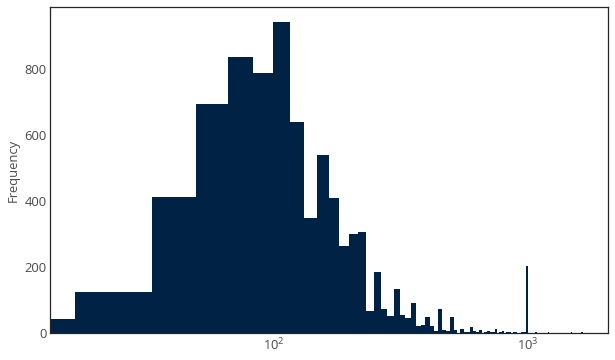

In [38]:
df.query('price <=2000')['price'].plot(kind='hist', 
                                       logx=True, bins=100, 
                                       color='#002244')

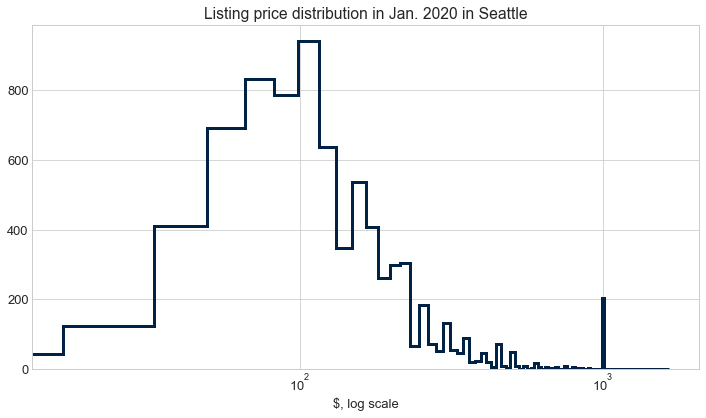

In [39]:
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots()
price_ = df.query('price <=2000')['price']
ax.hist(price_, bins=100, histtype='step', lw=3, color='#002244');
ax.set_xscale('log')
ax.set_title('Listing price distribution in Jan. 2020 in Seattle')
ax.set_xlabel('$, log scale')
fig.tight_layout()
fig.savefig('img/price_dist.png', optimize=True)

- most listing in $100 range

In [40]:
# we can have a look at all listing in Seattle
m = folium.Map(location=[47.6062, -122.3321], zoom_start=11)
df.apply(lambda row:folium.CircleMarker(location=[row["latitude"], 
                                                  row["longitude"]],
                                       radius=1).add_to(m),
         axis=1)
m

In [41]:
# or making aggregated data for easier comparison
# I used geojson to make an overlay over the map with neighborhoods
import json
with open('2020Jan/neighbourhoods.geojson') as f:
    goejson = json.loads(f.read())

In [42]:
m = folium.Map(location=[47.6062, -122.3321], zoom_start=11)
price_nhoods = df.groupby('neighbourhood_cleansed')['price'].mean()
print(price_nhoods.sort_values(ascending=False).head(5))
folium.Choropleth(
    geo_data=goejson,
    name='choropleth',
    data=price_nhoods,
    key_on='properties.neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='average price',
    reset=True
).add_to(m)
m


neighbourhood_cleansed
Pike-Market                  536.607759
International District       453.769912
East Queen Anne              365.307692
Central Business District    363.228070
West Queen Anne              275.179688
Name: price, dtype: float64


- so the top five expensive places are located in downtown and nearby

In [43]:
# how about number of listing
# price vs. option
m = folium.Map(location=[47.6062, -122.3321], zoom_start=11)
price_nhoods = df.groupby('neighbourhood_cleansed')['price'].count()
print(price_nhoods.sort_values(ascending=False).head(5))
folium.Choropleth(
    geo_data=goejson,
    name='choropleth',
    data=price_nhoods,
#     columns=['price'],
    key_on='properties.neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='listing count',
    reset=True
).add_to(m)
m

neighbourhood_cleansed
Broadway                     433
Belltown                     423
Central Business District    342
Wallingford                  296
Minor                        268
Name: price, dtype: int64


- a larger area have more listing. 

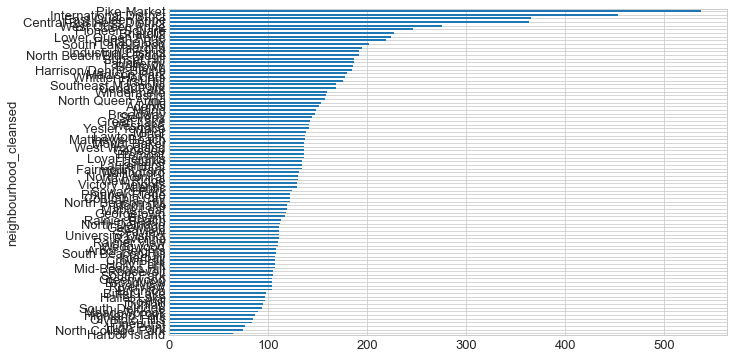

In [44]:
# too crowded
df.groupby('neighbourhood_cleansed')['price'].mean().sort_values().plot(kind='barh');

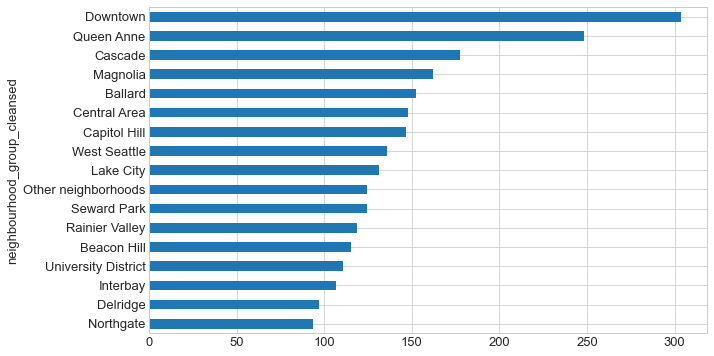

In [45]:
# we may want to group listing even more
ax = df.groupby('neighbourhood_group_cleansed')['price'].mean()\
.sort_values().plot(kind='barh');

- besides location, we do not know if the price is higher because of more rooms and bed in though location

In [46]:
avg_price = df.groupby('neighbourhood_group_cleansed')['price'].mean()
avg_beds = df.groupby('neighbourhood_group_cleansed')['beds'].mean()
avg_rooms =  df.groupby('neighbourhood_group_cleansed')['bedrooms'].mean()

In [47]:
# concatinate three dfs above 
dft = pd.concat([avg_price, avg_beds, avg_rooms], axis=1)
# calculate $ per room, $ per bed
dft['$/bed'] = dft['price']/dft['beds']
dft['$/room'] = dft['price']/dft['bedrooms']
dft['bed/room'] = dft['beds']/dft['bedrooms']

In [48]:
dft.sort_values(by='$/bed', ascending=False)

,price,beds,bedrooms,$/bed,$/room,bed/room
neighbourhood_group_cleansed,,,,,,
Interbay,106.945946,0.540541,0.459459,197.850000,232.764706,1.176471
Downtown,303.409309,1.600958,1.015068,189.517315,298.905257,1.577192
Cascade,177.312997,1.397878,1.198939,126.844402,147.891593,1.165929
Queen Anne,248.416667,2.181159,1.634058,113.892027,152.024390,1.334812
Capitol Hill,146.445570,1.784810,1.306717,82.051064,112.071343,1.365873
Magnolia,161.986207,2.172414,1.689655,74.565079,95.869388,1.285714
Ballard,152.431472,2.154822,1.624365,70.739694,93.840625,1.326562
Lake City,131.052239,1.872180,1.413534,69.999790,92.712488,1.324468
University District,110.777311,1.600840,1.084034,69.199475,102.189922,1.476744


- Interbay is an interesting one, it should have a great location or place to stay over during a long travel
- Other places such as Downtown, Cascade, Queen Anne, Capitol Hill are in downtown and historical districts

In [49]:
m = folium.Map(location=[47.6062, -122.3321], zoom_start=11)
price_nhoods = dft['$/room']
print(price_nhoods.sort_values(ascending=False).head(5))
folium.Choropleth(
    geo_data=goejson,
    name='choropleth',
    data=price_nhoods,
    key_on='properties.neighbourhood_group',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='$/room/night',
    reset=True
).add_to(m)
m

neighbourhood_group_cleansed
Downtown        298.905257
Interbay        232.764706
Queen Anne      152.024390
Cascade         147.891593
Capitol Hill    112.071343
Name: $/room, dtype: float64


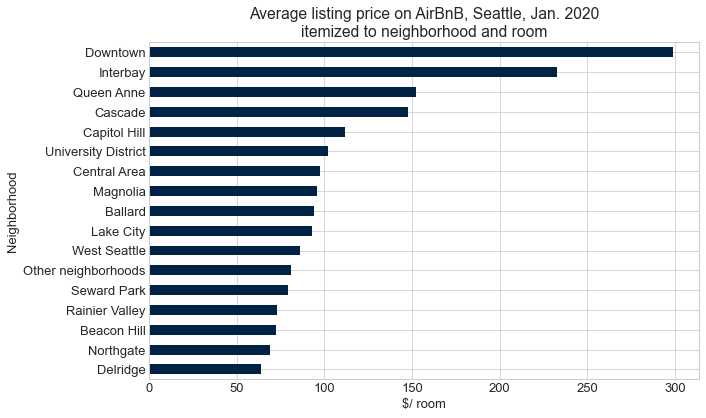

In [50]:
ax = dft['$/room'].sort_values().plot(kind='barh', color='#002244')
ax.set_ylabel("Neighborhood")
ax.set_xlabel("$/ room")
ax.set_title("Average listing price on AirBnB, Seattle, Jan. 2020\nitemized to neighborhood and room")
fig = plt.gcf()
fig.tight_layout()
fig.savefig('img/price_room.png')

## Avaialablity and Occupancy rate?

- since each dataset is a snapshot of that particular day, we will use the <code>calendar.csv</code> file to estimate the price change

In [51]:
# reading advance pricing 
dfc = pd.read_csv('2020Jan/calendar.csv.gz', compression='gzip')

In [52]:
dfc.shape

(2872185, 7)

In [53]:
dfc.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2318,2020-01-15,t,$99.00,$99.00,7,1000
1,5682,2020-01-15,f,$49.00,$49.00,3,14
2,5682,2020-01-16,f,$49.00,$49.00,3,14
3,5682,2020-01-17,f,$49.00,$49.00,3,14
4,5682,2020-01-18,f,$49.00,$49.00,3,14


In [54]:
dfc.dtypes

listing_id         int64
date              object
available         object
price             object
adjusted_price    object
minimum_nights     int64
maximum_nights     int64
dtype: object

In [55]:
# convert to numeric value
for column in ['price', 'adjusted_price']:
    dfc[column] = pd.to_numeric(dfc[column].str.replace('[$,]', ''))

In [56]:
# to datetime 
dfc['date'] = pd.to_datetime(dfc['date'])

In [57]:
# a complete table
dfc.isnull().sum()

listing_id        0
date              0
available         0
price             0
adjusted_price    0
minimum_nights    0
maximum_nights    0
dtype: int64

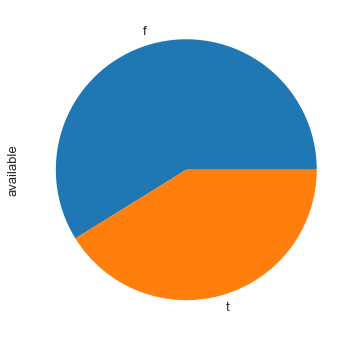

In [58]:
# availability of each listing during the year
ax = dfc['available'].astype('category').value_counts(normalize=True).plot(kind='pie')

In [59]:
# this calendar should cover one year in advance
dfc['date'].min(), dfc['date'].max()

(Timestamp('2020-01-15 00:00:00'), Timestamp('2021-01-13 00:00:00'))

In [60]:
# let look into the portion of availablity
dfc['available'] = dfc['available'].astype('category')
avail_percent = lambda group: group['available'].value_counts().loc['t']/group.shape[0]
avails = dfc.groupby('listing_id').apply(avail_percent)

percent
25     2116
50     1411
75      770
100    2035
dtype: int64


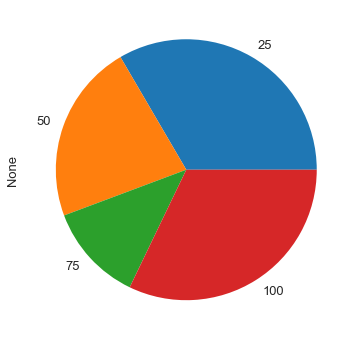

In [61]:
# and estimate the degree of available 
bins_avail = np.arange(0,1.1, 0.25)
avail_quantile = pd.cut(avails, bins_avail, labels = ['25', '50', '75', '100'] )
avail_quantile  = avail_quantile.rename('percent')
avail_listing = avail_quantile.to_frame().groupby('percent').size()
avail_listing.plot(kind='pie')
print(avail_listing)

- less 50% of the total listing with 75% or more availablity indicated hosts are willing to turn a part of their home for rent year round
- the [notes](http://insideairbnb.com/get-the-data.html) from data collector highlight the difficulty on availalblity of the listing.
- the calendar show the availablity of 365 days into the future, which is only the plan. This would suggest half the listing planned to the place to be rent out year around

In [62]:
# add more information about occupancy rate
dfr = pd.read_csv('2020Jan/reviews.csv.gz', compression='gzip')
dfr.shape

(421049, 6)

In [63]:
dfr.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2318,146,2008-09-15,2451,Kevin,1000 times better than staying at a hotel.
1,2318,126302712,2017-01-10,12332845,Jessica,"Our family (two couples, a two year old and an..."
2,2318,140977084,2017-04-01,4789466,Ivan,Top of the list locations we have stayed at! T...
3,2318,147262504,2017-04-25,55817131,Mike,"SUCH an awesome place. Very clean, quiet and s..."
4,2318,161806368,2017-06-18,113604590,Pete,We flew quite a distance to be at our only dau...


In [64]:
dfr.dtypes

listing_id        int64
id                int64
date             object
reviewer_id       int64
reviewer_name    object
comments         object
dtype: object

In [65]:
dfr['date'] = pd.to_datetime(dfr['date'])

In [66]:
dfr['year'] = dfr['date'].dt.year

- to estimate accupancy rate, I used a study [here](https://blog.atairbnb.com/economic-impact-airbnb), which estimate miminium nights per stay
- number of night per stay is not available for Seatle. For NYC, 6.4 night per stay, and SF that 3.5. For occupancy rate I selected the average which is 5 nights per stay with 50% of stays left a review. That bring that occupancy rate as <code>num_reviews x2 x nights_stayed</code>

In [67]:
average_review_yearly = dfr.groupby('year').count()['id']/df['id'].nunique()
average_review_yearly = average_review_yearly.to_frame()

In [68]:
average_review_yearly.drop(index=2020, inplace=True)

In [69]:
# assume two stays left one review, one stay lasted 5 nights
average_review_yearly['occupancy_rate'] = average_review_yearly['id']*2*5/365

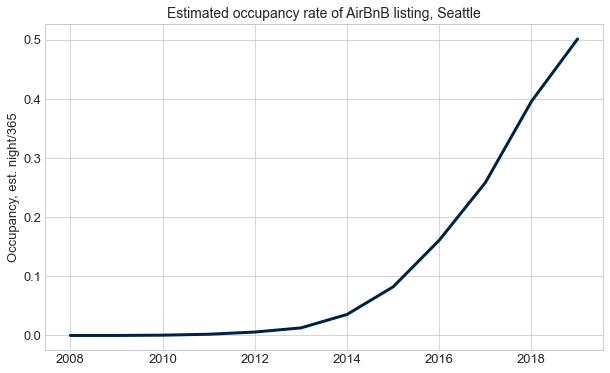

In [70]:
# the curve look promissing for AirBnB business model
plt.plot(average_review_yearly['occupancy_rate'], color='#002244', lw=3)
plt.title('Estimated occupancy rate of AirBnB listing, Seattle', fontsize=14)
plt.ylabel('Occupancy, est. night/365');

- since this data is pre-COVID-19 pandemic, the esitmated rate looks solid for AirBnB
- it is possible to analyze the most recent data (Oct 2020) to see what the impact COVID-19 on travel

## What about the price during the week and year?

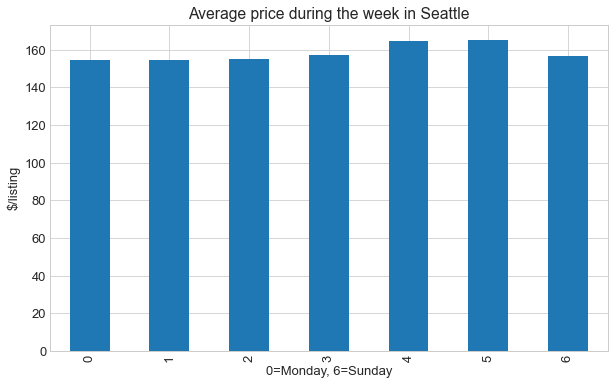

In [71]:
ax = dfc.groupby([dfc['date'].dt.weekday])['price'].mean().plot(kind='bar')
ax.set_title("Average price during the week in Seattle")
ax.set_ylabel("$/listing")
ax.set_xlabel("0=Monday, 6=Sunday");

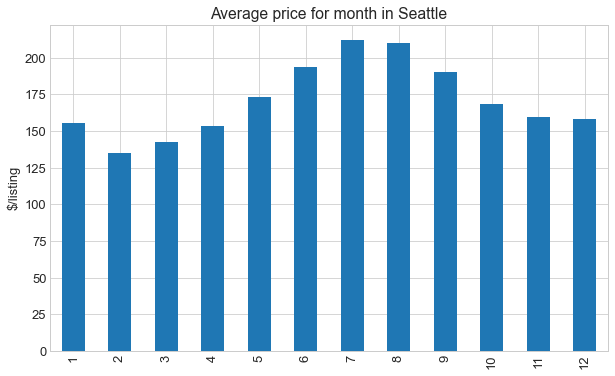

In [72]:
# over the year
ax = dfc.query('available=="t"').groupby(dfc['date'].dt.month)['price'].mean()\
.plot(kind='bar')
ax.set_title("Average price for month in Seattle")
ax.set_ylabel("$/listing")
ax.set_xlabel("");

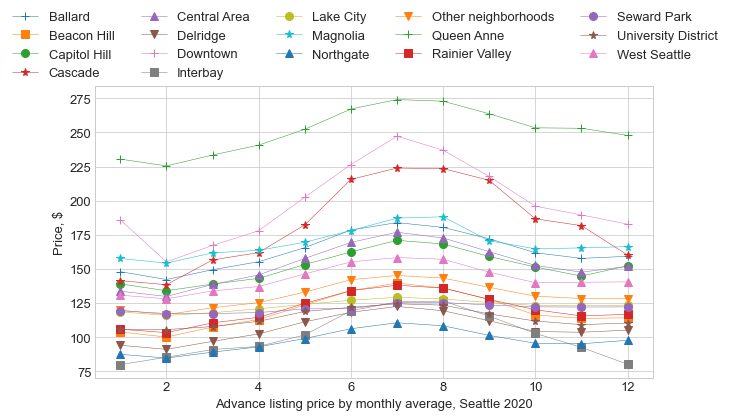

In [73]:
# let fragmenize to each group of neighbourhoods
import itertools
marker = itertools.cycle(('+', 's', 'o', '*', '^', 'v')) 
fig, ax = plt.subplots()

listing_groups = df.groupby('neighbourhood_group_cleansed')['id'].unique()
listing_groups.index

for site in listing_groups.index:
    data = dfc[dfc['listing_id'].isin(listing_groups[site])].groupby(dfc['date'].dt.month)['price'].mean()
    ax.plot(data, marker=next(marker), markersize = 8, lw=0.5, label=site)
fig.legend(loc='upper center', ncol=5)
fig.subplots_adjust(top=0.8)
# fig.tight_layout()
ax.set_xlabel('Advance listing price by monthly average, Seattle 2020')
ax.set_ylabel('Price, $');
fig.savefig('img/month_price.png')

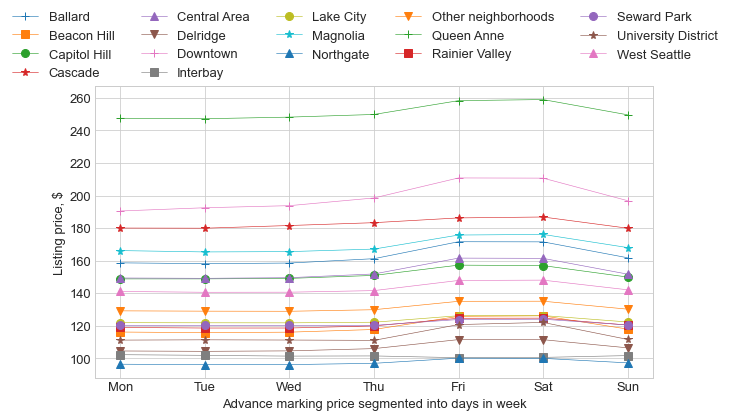

In [74]:
# advace marking price segmented into days in weeks
marker = itertools.cycle(('+', 's', 'o', '*', '^', 'v')) 
fig, ax = plt.subplots()
for site in listing_groups.index:
    data = dfc[dfc['listing_id'].isin(listing_groups[site])].groupby(dfc['date'].dt.weekday)['price'].mean()
    ax.plot(data, marker=next(marker), markersize = 8, lw=0.6, label=site)
fig.legend(loc='upper center', ncol=5)
ax.set_xlabel('Advance marking price segmented into days in week')
ax.set_ylabel('Listing price, $')
# the label shifted, a quick fix 
ax.set_xticklabels(['', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']); 
fig.subplots_adjust(top=0.8)
fig.savefig('img/price_weekday.png', optimize=True)

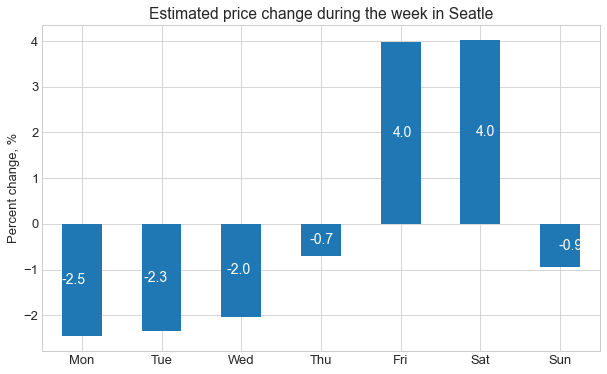

In [75]:
# how the price compared to each day
avg_price = dfc.groupby([dfc['date'].dt.weekday])['price'].mean().to_frame()
ax = avg_price.apply(
    lambda row: 100*(row['price'] - avg_price['price'].mean())/row['price'], 
    axis=1).plot(
        kind='bar',
        title='Estimated price change during the week in Seatle'
        );
# ax.set_xticks()
ax.set_ylabel("Percent change, %")
ax.set_xlabel("")
ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=0)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x()*1.04, p.get_height() * 0.5), 
                color='white', va='center', fontsize=14)

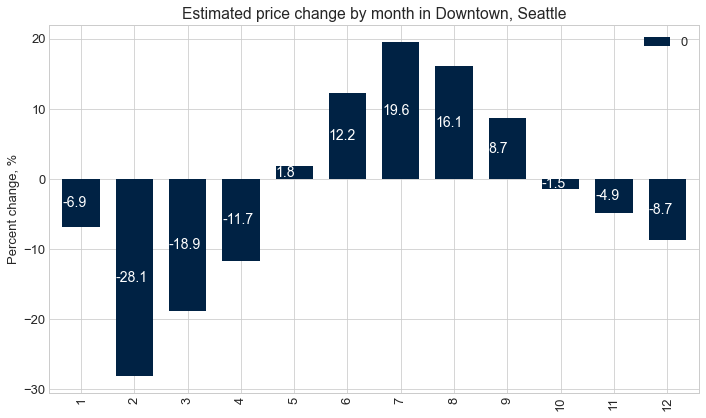

In [76]:
site = "Downtown"

# group listing price by listing_id in a neighborhood
avg_price = dfc[dfc['listing_id'].isin(listing_groups[site])].\
groupby(dfc['date'].dt.month)['price'].mean().to_frame()

# calculate price change in percent
avg_price = avg_price.apply(lambda row: 100*(row['price'] - avg_price['price'].\
                                 mean())/row['price'], axis=1).to_frame()
ax = avg_price.plot(
        kind='bar',
        title=f'Estimated price change by month in {site}, Seattle',
        color='#002244',
        width=0.7
        );
ax.set_ylabel("Percent change, %")
ax.set_xlabel("")
fig = plt.gcf()
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x(), p.get_height() * 0.5), 
                color='white', va='center', fontsize=14)
fig.tight_layout()
fig.savefig(f'img/month_{site}.png', optimize=True)

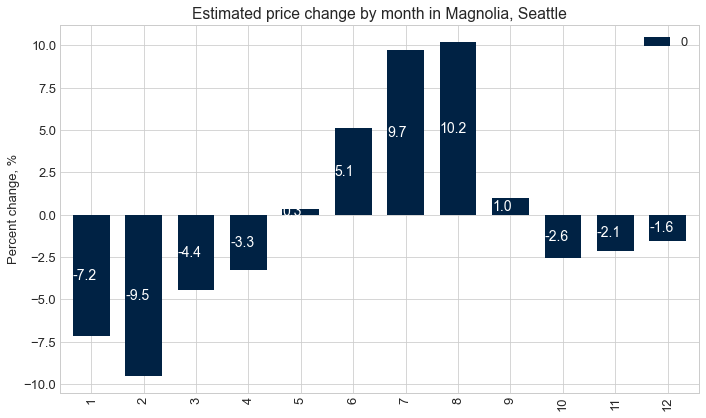

In [77]:
site = "Magnolia"

# group listing price by listing_id in a neighborhood
avg_price = dfc[dfc['listing_id'].isin(listing_groups[site])].\
groupby(dfc['date'].dt.month)['price'].mean().to_frame()

# calculate price change in percent
avg_price = avg_price.apply(lambda row: 100*(row['price'] - avg_price['price'].\
                                 mean())/row['price'], axis=1).to_frame()
ax = avg_price.plot(
        kind='bar',
        title=f'Estimated price change by month in {site}, Seattle',
        color='#002244',
        width=0.7
        );
ax.set_ylabel("Percent change, %")
ax.set_xlabel("")
fig = plt.gcf()
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x(), p.get_height() * 0.5), 
                color='white', va='center', fontsize=14)
fig.tight_layout()
fig.savefig(f'img/month_{site}.png', optimize=True)

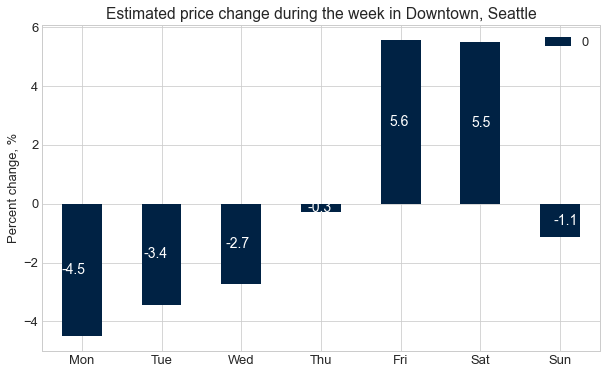

In [78]:
# change in price during weekdays and weekend
site = "Downtown"

# grouping with day and neighborhood
avg_price = dfc[dfc['listing_id'].isin(listing_groups[site])].\
groupby(dfc['date'].dt.weekday)['price'].mean().to_frame()

avg_price = avg_price.apply(lambda row: 100*(row['price'] - avg_price['price'].mean())/row['price'], axis=1).to_frame()
ax = avg_price.plot(
        kind='bar',
        title=f'Estimated price change during the week in {site}, Seattle',
        color='#002244'
        );

ax.set_ylabel("Percent change, %")
ax.set_xlabel("")
ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=0)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x()*1.03, p.get_height() * 0.5), 
                color='white', va='center', fontsize=14)

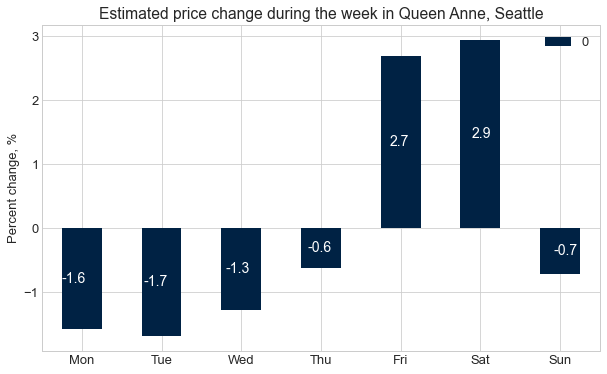

In [79]:
site = "Queen Anne"

avg_price = dfc[dfc['listing_id'].isin(listing_groups[site])].\
groupby(dfc['date'].dt.weekday)['price'].mean().to_frame()

avg_price = avg_price.apply(lambda row: 100*(row['price'] - avg_price['price'].mean())/row['price'], axis=1).to_frame()
ax = avg_price.plot(
        kind='bar',
        title=f'Estimated price change during the week in {site}, Seattle',
        color='#002244'
        );
ax.set_ylabel("Percent change, %")
ax.set_xlabel("")
ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=0)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x()*1.03, p.get_height() * 0.5), 
                color='white', va='center', fontsize=14)

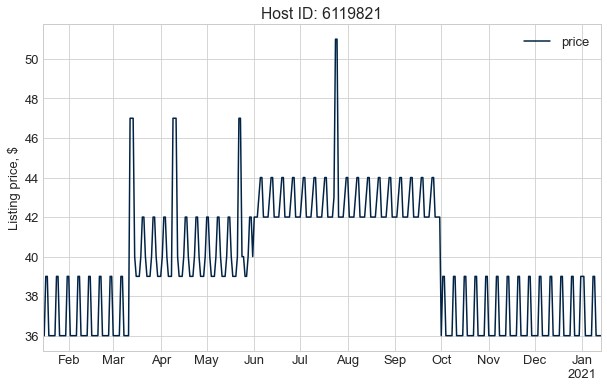

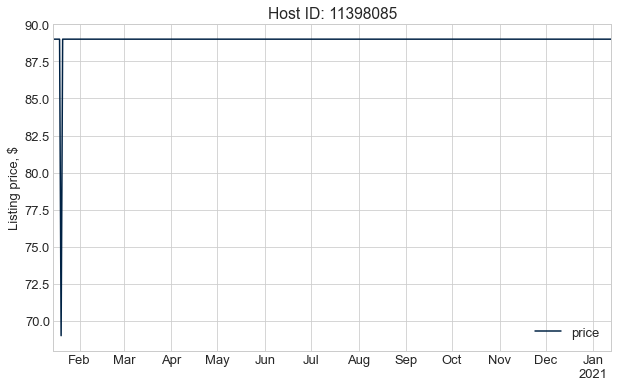

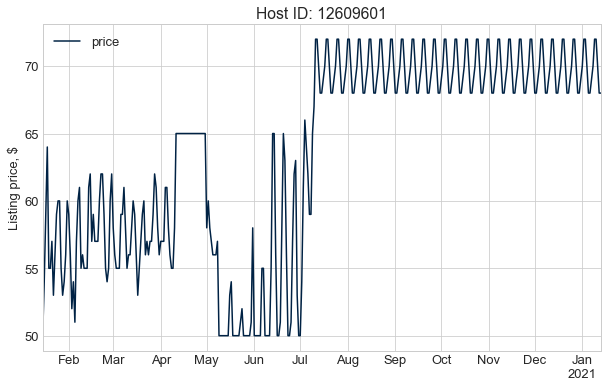

In [80]:
# using the top_review above, we can have a look on the price marking 
top_num_reviews = dfr.query('year==2019').groupby('listing_id').\
count()['id'].sort_values(ascending=False).head(10)
top_num_reviews.index

for id_ in top_num_reviews.index[:3]:
    ax = dfc.query(f'listing_id=={id_}')[['date', 'price']].plot(
        x='date',y='price', color='#002244')
    ax.set_title(f'Host ID: {id_}');
    ax.set_ylabel('Listing price, $')
    ax.set_xlabel('')

- number of reviews is not the same as 5-star rating, but often, the highest rating and trusted host should have more booking, and received more reviews. It is very intersting to see if the advancemarking price will stay close the actually listing price

# Could we build a predictive pricing model?

## Continue to clean data

In [81]:
# check out columns needed to be wrangled
df.select_dtypes(exclude=['int', 'float']).columns

Index(['host_since', 'host_response_time', 'host_is_superhost',
       'host_identity_verified', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'zipcode', 'is_location_exact',
       'property_type', 'room_type', 'calendar_updated', 'first_review',
       'last_review', 'license', 'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification'],
      dtype='object')

In [82]:
# convert some datetime object to numeric value
# convert first_review and last_review from datetime to a timedelta 
df['last_review'] = df.apply(lambda row: \
         (last_scraped - row['last_review']).total_seconds()/(24*3600), axis=1)

In [83]:
df['first_review'] = df.apply(lambda row: \
          (last_scraped - row['first_review']).total_seconds()/(24*3600), axis=1)

In [84]:
df['host_since'] = last_scraped.year - df['host_since'].dt.year

In [85]:
# duplicated feature
df[['neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'zipcode']]

,neighbourhood_cleansed,neighbourhood_group_cleansed,zipcode
0,Madrona,Central Area,98122
1,South Delridge,Delridge,98106
2,Wallingford,Other neighborhoods,98103
3,Georgetown,Other neighborhoods,98108
4,First Hill,Downtown,98101
...,...,...,...
7864,Belltown,Downtown,98121
7865,Wallingford,Other neighborhoods,98103
7866,Broadway,Capitol Hill,98122
7867,North Beacon Hill,Beacon Hill,98144


In [86]:
# zipcode has different length (it should be 5)
df['zipcode'].str.len().value_counts()

5.0     7707
10.0       3
1.0        1
8.0        1
Name: zipcode, dtype: int64

In [87]:
# those with 10-character long
df[df['zipcode'].str.len() ==10]['zipcode']

5899    98104-4417
5931    98104-4417
5937    98104-4417
Name: zipcode, dtype: object

In [88]:
# manually fixing
df.loc[5899, 'zipcode'] = 98104
df.loc[5931, 'zipcode'] = 98104
df.loc[5937, 'zipcode'] = 98104
df.loc[1525, 'zipcode'] = 98122

In [89]:
df['zipcode'].str.len().value_counts()

5.0    7707
1.0       1
Name: zipcode, dtype: int64

- notes:
    - more listing on the East side of Seatle
    - more expensive option located near in the West site, near downtown and the bay
    - let use all location grouping (zipcode, neighbourhoods) and evaluate the correlation to the listing price

In [90]:
df.select_dtypes(exclude=['int', 'float']).columns

Index(['host_response_time', 'host_is_superhost', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'zipcode',
       'is_location_exact', 'property_type', 'room_type', 'calendar_updated',
       'license', 'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification'],
      dtype='object')

## Test correlation on price

In [91]:
# more on fees and price
# https://www.airbnb.com/help/article/1857/what-are-airbnb-service-fees
# https://www.tripping.com/industry/rental-companies/airbnb-fees

In [92]:
df.corr()['price'].sort_values(ascending=False)

price                                           1.000000
host_listings_count                             0.261104
host_total_listings_count                       0.261104
accommodates                                    0.229226
bedrooms                                        0.206255
guests_included                                 0.194650
cleaning_fee                                    0.182728
beds                                            0.167510
availability_365                                0.145833
bathrooms                                       0.144388
calculated_host_listings_count_entire_homes     0.109373
calculated_host_listings_count                  0.106761
maximum_nights                                  0.064554
id                                              0.058901
maximum_maximum_nights                          0.052016
host_id                                         0.050892
minimum_maximum_nights                          0.049499
maximum_nights_avg_ntm         

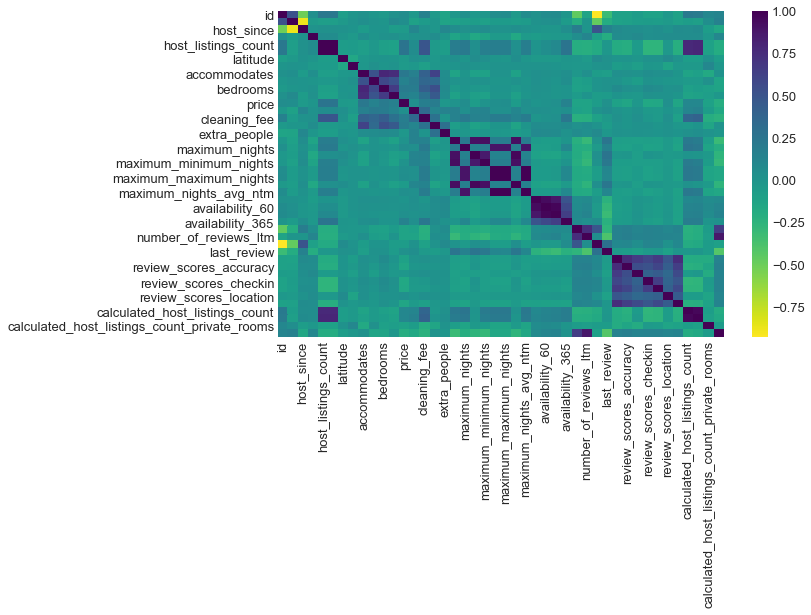

In [93]:
sns.heatmap(df.corr(), cmap='viridis_r');

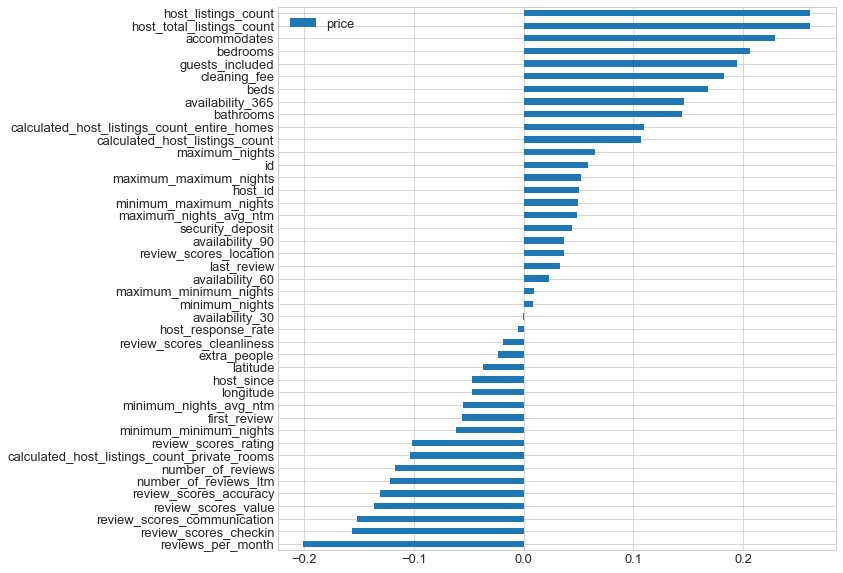

In [94]:
fig, ax = plt.subplots(figsize=(10,10))
df.corr()['price'].sort_values().to_frame().dropna().drop('price').plot.barh(ax=ax);

some columns appear to be duplicated in nature
- <b>listing count</b>: 'host_listings_count', 'host_total_listings_count', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms'
- <b>reviews</b>: number_of_reviews, 'number_of_reviews_ltm', 'first_review', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_checkin', 'review_scores_communication', 'review_scores_value', 'reviews_per_month'

In [95]:
df.drop(columns=['host_listings_count', 'host_total_listings_count'], inplace=True)

In [96]:
df.drop(columns=['id', 'host_id', 'minimum_minimum_nights','maximum_maximum_nights'], inplace=True)

In [97]:
df.columns

Index(['host_since', 'host_response_time', 'host_response_rate',
       'host_is_superhost', 'host_identity_verified', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'zipcode', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'security_deposit',
       'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights',
       'maximum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'first_review', 'last_review', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'license',
       'instan

In [98]:
search_kw(df, 'night')

['minimum_nights',
 'maximum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm']

In [99]:
df.drop(columns=['maximum_minimum_nights', 'minimum_maximum_nights'], inplace=True)

In [100]:
df['minimum_nights_avg_ntm'].mean()

12.091714322023323

In [101]:
# select columns with weak correlation to price
price_corr = df.corr()['price'].dropna().drop('price')
weak_corr = price_corr[abs(price_corr)< 0.05].index
weak_corr

Index(['host_since', 'host_response_rate', 'latitude', 'longitude',
       'security_deposit', 'extra_people', 'minimum_nights',
       'maximum_nights_avg_ntm', 'availability_30', 'availability_60',
       'availability_90', 'last_review', 'review_scores_cleanliness',
       'review_scores_location'],
      dtype='object')

In [102]:
# not drop columns
# df.drop(columns=weak_corr, inplace=True)
# df.shape

In [103]:
df.select_dtypes(include=['int', 'float']).isnull().any().sum()

16

In [104]:
df_copy = df.copy(deep=True)
# df = df_copy.copy(deep=True)

In [105]:
df.select_dtypes(include=['float', 'int'])

,host_since,host_response_rate,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,security_deposit,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,reviews_per_month
0,12,100.0,47.610820,-122.290820,9,2.5,4.0,4.0,296.0,500.0,...,10.0,10.0,10.0,10.0,10.0,10.0,2,2,0,0.22
1,11,NaN,47.523980,-122.359890,2,1.0,0.0,1.0,48.0,120.0,...,10.0,10.0,10.0,10.0,9.0,10.0,1,1,0,3.86
2,11,100.0,47.654110,-122.337610,2,1.0,1.0,1.0,90.0,200.0,...,9.0,9.0,10.0,10.0,10.0,9.0,3,3,0,1.17
3,11,100.0,47.550620,-122.320140,2,3.0,1.0,1.0,62.0,100.0,...,10.0,10.0,10.0,10.0,10.0,10.0,7,0,7,1.28
4,11,100.0,47.612650,-122.329360,2,1.0,1.0,1.0,79.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,4,3,1,3.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7864,6,100.0,47.615870,-122.346890,4,1.0,1.0,2.0,99.0,500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,17,17,0,NaN
7865,4,100.0,47.662091,-122.344802,2,1.0,0.0,1.0,79.0,200.0,...,NaN,NaN,NaN,NaN,NaN,NaN,3,3,0,NaN
7866,1,90.0,47.616281,-122.318107,2,1.0,0.0,1.0,75.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3,3,0,NaN
7867,0,NaN,47.589133,-122.312488,8,2.0,3.0,3.0,399.0,250.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,NaN


In [106]:
# fill all missing value in numeric types with mean of that columns
def fill_na(df):  
    for column in df.select_dtypes(include=['float', 'int']).columns:
        df[column] = df[column].fillna(value=df[column].mean())
    return df
               

In [107]:
df = fill_na(df)

<hr style="border-color:red"> 

In [108]:
def remove_outliner(df):
    '''remove outliers on price fall outsite 1.5 times of IQR'''
    Q3 = df['price'].quantile(.75)
    Q1 = df['price'].quantile(.25)
    IQR = Q3 - Q1
    dft = df[~((df['price'] < (Q1 - 1.5 * IQR)) |(df['price'] > (Q3 + 1.5 * IQR)))]
    return dft

In [109]:
df['price'].describe()

count    7869.000000
mean      173.362689
std       264.221391
min         0.000000
25%        80.000000
50%       120.000000
75%       190.000000
max      9999.000000
Name: price, dtype: float64

In [110]:
# df = remove_outliner(df)

In [111]:
def encoding_dummies(df, debug=False):   
    '''encoding columns with category variable
    return df
    '''
    for column in df.select_dtypes(include='object'):
        if debug:
            print(column)
        # a temporary dataframe for encoding
        dft = pd.get_dummies(df[column], drop_first=True, dummy_na=True,
                            prefix=column, prefix_sep='_')
        df.drop(columns=column, inplace=True)
        df = df.join(dft)
    return df

In [112]:
df = encoding_dummies(df)

In [113]:
df.isnull().any().sum()

0

In [114]:
price_corr_r2 = df.corr()['price'].dropna().drop('price')
price_corr_r2

host_since                                        -0.046832
host_response_rate                                -0.003979
latitude                                          -0.037235
longitude                                         -0.047345
accommodates                                       0.229226
                                                     ...   
cancellation_policy_strict_14_with_grace_period    0.163930
cancellation_policy_super_strict_30               -0.000510
cancellation_policy_super_strict_60                0.054213
require_guest_profile_picture_t                    0.035031
require_guest_phone_verification_t                 0.030882
Name: price, Length: 297, dtype: float64

In [115]:
weak_corr_r2 = price_corr_r2[abs(price_corr_r2)< 0.1].index
weak_corr_r2

Index(['host_since', 'host_response_rate', 'latitude', 'longitude',
       'security_deposit', 'extra_people', 'minimum_nights', 'maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
       ...
       'calendar_updated_yesterday', 'license_licensed',
       'license_licensed_other', 'license_pending', 'license_nan',
       'cancellation_policy_strict', 'cancellation_policy_super_strict_30',
       'cancellation_policy_super_strict_60',
       'require_guest_profile_picture_t',
       'require_guest_phone_verification_t'],
      dtype='object', length=270)

# Regression Model

## Transform data

In [116]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [117]:
ss_x = StandardScaler()
ss_y = StandardScaler()

In [118]:
df.shape

(7869, 310)

In [119]:
y = df[['price']]
X = df.drop(columns='price')

In [120]:
X_scaled = ss_x.fit_transform(X)

In [121]:
y_scaled = ss_y.fit_transform(y)

In [122]:
X_scaled.shape

(7869, 309)

In [123]:
y_scaled.shape

(7869, 1)

In [124]:
df['price'].describe()

count    7869.000000
mean      173.362689
std       264.221391
min         0.000000
25%        80.000000
50%       120.000000
75%       190.000000
max      9999.000000
Name: price, dtype: float64

In [125]:
# random_set for low r2 is magic
Xs_train, Xs_test, ys_train, ys_test = train_test_split(
    X_scaled, y_scaled, train_size=0.7, random_state=2020)

In [126]:
def prepare_data(df, random_state=2020):
    '''split data into training and test set
    INPUT: DataFrame (df)
    OUTPUT: normalized X_train, X_test, y_train, y_test
    '''
    y = df[['price']]
    X = df.drop(columns='price')
    ss_X = StandardScaler()
    ss_y = StandardScaler()
    X_scaled = ss_X.fit_transform(X)
    y_scaled = ss_y.fit_transform(y)
    Xs_train, Xs_test, ys_train, ys_test = train_test_split(
            X_scaled, y_scaled, train_size=0.7, random_state=random_state)
    return Xs_train, Xs_test, ys_train, ys_test   

## Linear Regression

In [127]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error


In [128]:
linear_reg = LinearRegression(fit_intercept=True)
linear_reg.fit(Xs_train, ys_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [129]:
def visualize_fitting(model):
    r2_train = r2_score(ys_train, model.predict(Xs_train))
    r2_test = r2_score(ys_test, model.predict(Xs_test))
    print(f'r2 on trainset = {r2_train:.2f}; on testset = {r2_test:.2f}')
    plt.scatter(ss_y.inverse_transform(ys_test), 
            ss_y.inverse_transform(model.predict(Xs_test)))
    return None

r2 on trainset = 0.29; on testset = 0.41


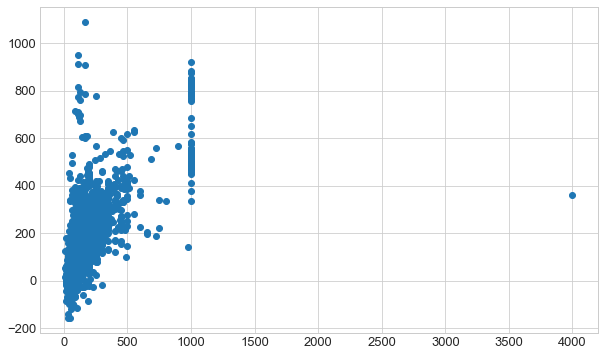

In [130]:
visualize_fitting(linear_reg)

- r2 score is in a low (weak) range with a higher value on test set. This could be an indicator of randomness of fitting rather any underlying correlation
- in fact, if you change the random state, the r2 changed wildly

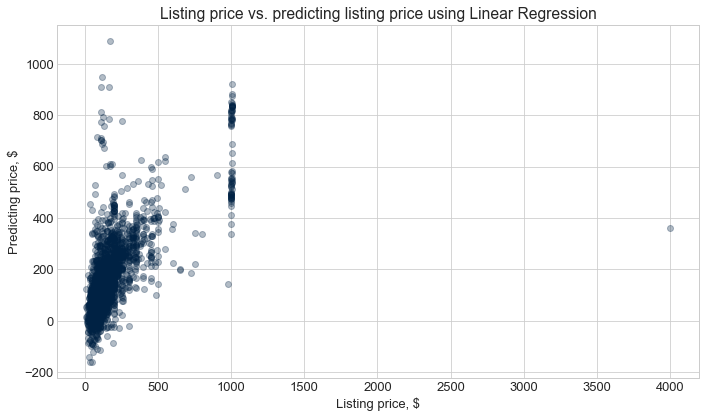

In [131]:
# first, let save the graph with title and labels
fig, ax = plt.subplots()
ax.scatter(ss_y.inverse_transform(ys_test), 
            ss_y.inverse_transform(linear_reg.predict(Xs_test)), 
           color='#002244', alpha=0.3)
ax.set_ylabel('Predicting price, $')
ax.set_xlabel('Listing price, $')
ax.set_title('Listing price vs. predicting listing price using Linear Regression')
fig.tight_layout()
fig.savefig('img/price_scatter.png', optimize=True)

- a large samples with \$1000 listing dollars making the price looks "pretty", but harder for any model to draw out any correlation
- a good correlation in the range below \$500, and the model can be improve by remove outliners on price

In [132]:
# test effect of random_state on model performance
def test_random_state(df, random_state=1):
    '''train a linear regression model with different random state'''
    
    y = df[['price']]
    X = df.drop(columns='price')
    
    X_train, X_test, y_train, y_test = train_test_split(
            X, y, train_size=0.7, random_state=random_state)

    linear_reg = LinearRegression(normalize=True, n_jobs=-1)
    linear_reg.fit(X_train, y_train)
    r2_train = r2_score(y_train, linear_reg.predict(X_train))
    r2_test = r2_score(y_test, linear_reg.predict(X_test))
    print(f'Random state = {random_state}\nr2 on trainset = {r2_train:.2f}; on testset = {r2_test:.2f}')
    return None
    # 

In [133]:
import random
for i in range(10):
    random_state = random.randint(1, 2020)
    test_random_state(df, random_state=random_state)
test_random_state(df, random_state=2020) # magical

Random state = 1851
r2 on trainset = 0.32; on testset = -10210127208859739355086848.00
Random state = 535
r2 on trainset = 0.34; on testset = -11848743170121364567752704.00
Random state = 1641
r2 on trainset = 0.40; on testset = -53172706067672262605012992.00
Random state = 1650
r2 on trainset = 0.29; on testset = -2571059554395459743121408.00
Random state = 1197
r2 on trainset = 0.33; on testset = -243829301431376973676937216.00
Random state = 865
r2 on trainset = 0.30; on testset = -653187525809545691512438784.00
Random state = 661
r2 on trainset = 0.29; on testset = -140128046994987296032292864.00
Random state = 417
r2 on trainset = 0.31; on testset = -43527133078558072987713536.00
Random state = 818
r2 on trainset = 0.41; on testset = -40925495325451940442144768.00
Random state = 275
r2 on trainset = 0.28; on testset = -3116608653801007318839590912.00
Random state = 2020
r2 on trainset = 0.28; on testset = 0.41


## Decision Tree

In [134]:
from sklearn.tree import DecisionTreeRegressor

In [135]:
tree_regressor = DecisionTreeRegressor(criterion="mse")
tree_regressor.fit(Xs_train, ys_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [136]:
r2_score(ys_train, tree_regressor.predict(Xs_train))

1.0

r2 on trainset = 1.00; on testset = 0.58


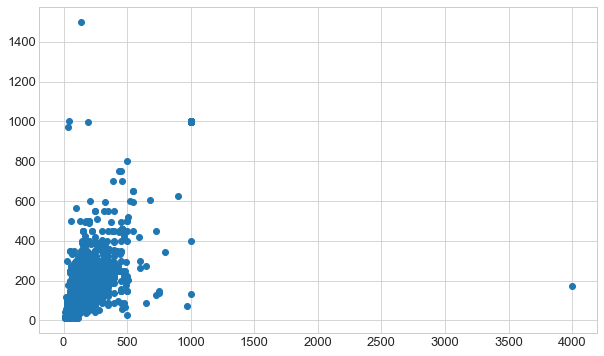

In [137]:
visualize_fitting(tree_regressor)

## A more complicated model: RandomForest

In [138]:
from sklearn.ensemble import RandomForestRegressor

In [139]:
rf_reg = RandomForestRegressor(n_jobs=-1)
rf_reg.fit(Xs_train, ys_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

r2 on trainset = 0.94; on testset = 0.63


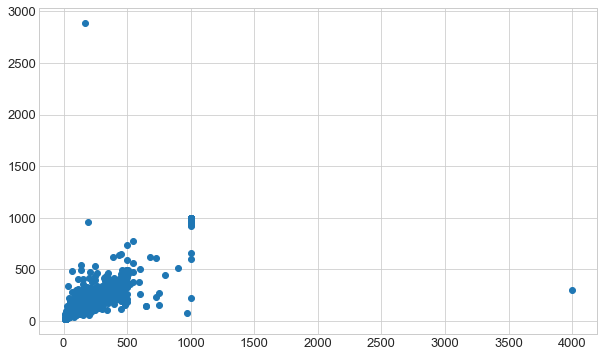

In [140]:
visualize_fitting(rf_reg)

In [141]:
# compare r2-score by three models

models = []
models.append(('LR', LinearRegression()))
models.append(('DT', DecisionTreeRegressor()))
models.append(('RF', RandomForestRegressor()))
Xs_train, Xs_test, ys_train, ys_test = prepare_data(df)
results = dict()
for name, model in models:
    model.fit(Xs_train, ys_train)
    r2_train = r2_score(ys_train, model.predict(Xs_train))
    r2_test = r2_score(ys_test, model.predict(Xs_test))
    results.update({name: {'trainset': r2_train,
                           'testset': r2_test
                           }})
    results[name]['trainset'] = r2_train
    results[name]['testset'] = r2_test

In [142]:
results

{'LR': {'trainset': 0.28593529408119833, 'testset': 0.4053600458713209},
 'DT': {'trainset': 1.0, 'testset': 0.49311446711299534},
 'RF': {'trainset': 0.9155033850760056, 'testset': 0.6672507370367458}}

In [143]:
data = pd.DataFrame(data=results)
data

,LR,DT,RF
trainset,0.285935,1.000000,0.915503
testset,0.405360,0.493114,0.667251


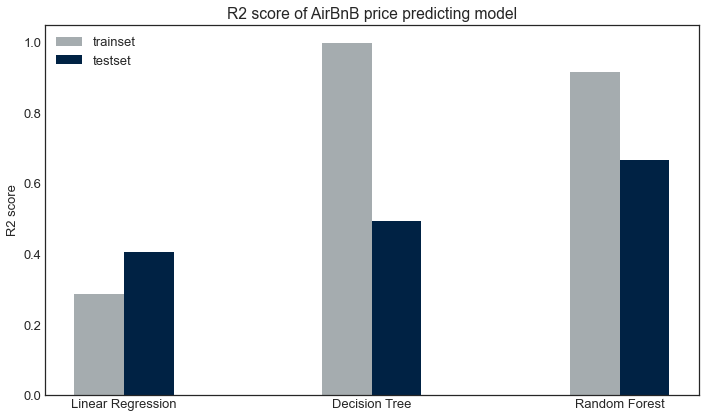

In [144]:
# visualize r2 score
plt.style.use('seaborn-white')
fig, ax = plt.subplots()

labels = ['Linear Regression', 'Decision Tree', 'Random Forest']
width = 0.2
x = np.arange(len(labels))

ax.bar(x-width/2, height=data.loc['trainset'], width=width,
       label='trainset', color='#a5acaf')
ax.bar(x+width/2, height=data.loc['testset'], width=width, 
       label='testset', color='#002244')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_title("R2 score of AirBnB price predicting model")
ax.set_ylabel('R2 score')
ax.legend()
fig.tight_layout()
fig.savefig('img/r2_score.png', optimize=True)

- it is easy to fit data to any machine learning model, but it is not easy to get a high and consistent correlation on training data and testing data
- for this particular set and random state, the Linear Regression model shows randomness in predicting because of a higher r2 score on testing set.
- the DecisionTree and RandomForest regession models shows over-fitting or memorization in which the model performs well with training data but a lack of generalization on testing data, and thus less useful for prediction 